In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import RobustScaler
import warnings
warnings.filterwarnings('ignore')
from sklearn.cluster import HDBSCAN
from tqdm import tqdm
from sklearn.metrics import silhouette_samples, silhouette_score
import colorsys

In [3]:
# HIPERPARÁMETROS
SIZE=100
SAMPLES=6

In [4]:
df_full = pd.read_csv("dataset_porcionado_completo.csv")
df_full["distance"] = 1/df_full["parallax_"]

In [5]:
clustering_on = ["pmra", "pmdec", "parallax"]

In [6]:
def saturate_color(rgba, saturation_scale=2.0):
    """Aumenta la saturación de un color RGBA para evitar tonos muy pálidos."""
    r, g, b, a = rgba
    h, s, v = colorsys.rgb_to_hsv(r, g, b)
    s = min(1.0, s * saturation_scale)
    v = min(1.0, v * 1.1)
    r2, g2, b2 = colorsys.hsv_to_rgb(h, s, v)
    return (r2, g2, b2, a)

In [7]:
def make_cluster_id(cell_id, local_label):
    """Convierte (cell_id, label_local) → ID global tipo '03_001'. Ruido → '03_999'."""
    region = f"{int(cell_id):02d}"
    if local_label == -1:
        return f"{region}_999"
    return f"{region}_{int(local_label):03d}"

In [8]:
def showGraphics(df, unique_labels, id_map, with_silhouette=True, cell_id=None):
    colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
    rich_colors = [saturate_color(c) for c in colors]

    cluster_labels = sorted([l for l in unique_labels if l != -1])
    cluster_colors = [rich_colors[i] for i, l in enumerate(sorted(unique_labels)) if l != -1]

    if with_silhouette:
        fig = plt.figure(figsize=(16, 14))
        gs = fig.add_gridspec(3, 2, hspace=0.4, wspace=0.35)
        ax_cmd     = fig.add_subplot(gs[0, 0])
        ax_cmd_sil = fig.add_subplot(gs[0, 1])
        ax_vpd     = fig.add_subplot(gs[1, 0], aspect='equal', adjustable='datalim')
        ax_vpd_sil = fig.add_subplot(gs[1, 1], aspect='equal', adjustable='datalim')
        ax_hist    = fig.add_subplot(gs[2, 0])
        ax_radial  = fig.add_subplot(gs[2, 1])
    else:
        fig = plt.figure(figsize=(16, 14))
        gs = fig.add_gridspec(3, 2, hspace=0.4, wspace=0.35)
        ax_cmd    = fig.add_subplot(gs[0, 0])
        ax_vpd    = fig.add_subplot(gs[1, 0], aspect='equal', adjustable='datalim')
        # Celda vacía gs[0,1] y gs[1,1] — las dejamos libres para mantener proporción
        ax_hist   = fig.add_subplot(gs[2, 0])
        ax_radial = fig.add_subplot(gs[2, 1])

    ra_min, ra_max   = df['ra'].min(),  df['ra'].max()
    dec_min, dec_max = df['dec'].min(), df['dec'].max()
    title = f"Región {cell_id} | RA: [{ra_min:.2f}°, {ra_max:.2f}°]  Dec: [{dec_min:.2f}°, {dec_max:.2f}°]"
    fig.suptitle(title, fontsize=11, y=1.01)

    # ── Centro y escala del VPD ──────────────────────────────────────────────
    cluster_mask = df['label_hb'] != -1
    if cluster_mask.any():
        pmra_c  = df.loc[cluster_mask, 'pmra'].median()
        pmdec_c = df.loc[cluster_mask, 'pmdec'].median()
        r = np.sqrt(
            (df.loc[cluster_mask, 'pmra']  - pmra_c)**2 +
            (df.loc[cluster_mask, 'pmdec'] - pmdec_c)**2
        )
        r_max = np.percentile(r, 90) * 2.5
    else:
        pmra_c, pmdec_c, r_max = 0, 0, 5

    # ── Campo (label = -1) ───────────────────────────────────────────────────
    field = df['label_hb'] == -1
    if field.any():
        ax_vpd.plot(
            df['pmra'][field], df['pmdec'][field],
            marker='o', linestyle='None', markersize=3,
            markerfacecolor='gray', markeredgewidth=0,
            alpha=0.15, label='Campo'
        )
        ax_cmd.plot(
            df['phot_bp_mean_mag'][field] - df['phot_rp_mean_mag'][field],
            df['phot_g_mean_mag'][field],
            marker='o', linestyle='None', markersize=2,
            markerfacecolor='gray', markeredgewidth=0,
            alpha=0.15, label='Campo'
        )

    # ── VPD por cluster ──────────────────────────────────────────────────────
    for lbl, col in zip(cluster_labels, cluster_colors):
        cond = df['label_hb'] == lbl
        ax_vpd.plot(
            df['pmra'][cond], df['pmdec'][cond],
            markerfacecolor=col[:3], marker='o', linestyle='None',
            markersize=5, alpha=1,
            label=f"{id_map[lbl]}: {cond.sum()} estrellas"
        )
    ax_vpd.set_xlabel("pmra [mas $yr^{-1}$]")
    ax_vpd.set_ylabel("pmdec [mas $yr^{-1}$]")
    ax_vpd.legend(fontsize=8)
    ax_vpd.set_xlim(pmra_c  - r_max, pmra_c  + r_max)
    ax_vpd.set_ylim(pmdec_c - r_max, pmdec_c + r_max)

    # ── CMD por cluster ──────────────────────────────────────────────────────
    for lbl, col in zip(cluster_labels, cluster_colors):
        cond = df['label_hb'] == lbl
        if with_silhouette:
            sil = df[cond]["cluster_silhouette"].iloc[0]
            label_str = f'{id_map[lbl]} | {cond.sum()} estrellas | Sil: {sil:.3f}'
        else:
            label_str = f'{id_map[lbl]} | {cond.sum()} estrellas'
        ax_cmd.plot(
            df['phot_bp_mean_mag'][cond] - df['phot_rp_mean_mag'][cond],
            df['phot_g_mean_mag'][cond],
            marker='o', linestyle='None', markersize=3,   # subido de 1 → 3
            markerfacecolor=col[:3], label=label_str
        )
    ax_cmd.set_xlabel("BP-RP")
    ax_cmd.set_ylabel("G")
    ax_cmd.set_xlim(-2,6)
    ax_cmd.invert_yaxis()
    ax_cmd.legend(markerscale=4, fontsize=9, loc='upper right')

    # ── Paneles de silueta ───────────────────────────────────────────────────
    if with_silhouette:
        # Campo en VPD silueta
        if field.any():
            ax_vpd_sil.scatter(
                df['pmra'][field], df['pmdec'][field],
                color='gray', s=2, alpha=0.15
            )
        sc = ax_vpd_sil.scatter(
            df["pmra"][~field], df["pmdec"][~field],
            c=df["silhouette"][~field], cmap="viridis", s=2
        )
        ax_vpd_sil.set_xlabel("pmra [mas $yr^{-1}$]")
        ax_vpd_sil.set_ylabel("pmdec [mas $yr^{-1}$]")
        plt.colorbar(sc, ax=ax_vpd_sil).set_label("Silhouette")
        ax_vpd_sil.set_xlim(pmra_c  - r_max, pmra_c  + r_max)
        ax_vpd_sil.set_ylim(pmdec_c - r_max, pmdec_c + r_max)

        # Campo en CMD silueta
        if field.any():
            ax_cmd_sil.scatter(
                df['phot_bp_mean_mag'][field] - df['phot_rp_mean_mag'][field],
                df['phot_g_mean_mag'][field],
                color='gray', s=2, alpha=0.15
            )
        sc2 = ax_cmd_sil.scatter(
            df["phot_bp_mean_mag"][~field] - df["phot_rp_mean_mag"][~field],
            df["phot_g_mean_mag"][~field],
            c=df["silhouette"][~field], cmap="viridis", s=2
        )
        ax_cmd_sil.set_xlabel("BP-RP")
        ax_cmd_sil.set_ylabel("G")
        ax_cmd_sil.set_xlim(-2,6)
        ax_cmd_sil.invert_yaxis()
        plt.colorbar(sc2, ax=ax_cmd_sil).set_label("Silhouette")

    # ── Histograma de distancias ─────────────────────────────────────────────
    for lbl, col in zip(cluster_labels, cluster_colors):
        cond = df['label_hb'] == lbl
        ax_hist.hist(
            df['distance'][cond],
            bins=30, color=col[:3], alpha=0.7,
            label=f"{id_map[lbl]}"
        )
    ax_hist.set_xlabel("Distancia [pc]")
    ax_hist.set_ylabel("Número de estrellas")
    ax_hist.legend(fontsize=8)

    # ── Perfil radial (compartido para todos los clusters) ───────────────────
    for lbl, col in zip(cluster_labels, cluster_colors):
        cond = df['label_hb'] == lbl
        df_cl = df[cond].copy()

        # Centro del cluster: mediana de RA/Dec
        ra_c  = df_cl['ra'].median()
        dec_c = df_cl['dec'].median()
        d_c   = df_cl['distance'].median()

        # Separación angular → distancia física (pc)
        delta_ra  = np.deg2rad(df_cl['ra']  - ra_c) * np.cos(np.deg2rad(dec_c))
        delta_dec = np.deg2rad(df_cl['dec'] - dec_c)
        theta_rad = np.sqrt(delta_ra**2 + delta_dec**2)
        r_pc = np.tan(theta_rad) * d_c

        # Perfil: densidad de estrellas en anillos
        r_max = np.percentile(r_pc, 98)
        bins  = np.linspace(0, r_max, 15)
        counts, edges = np.histogram(r_pc, bins=bins)
        areas  = np.pi * (edges[1:]**2 - edges[:-1]**2)
        density = counts / areas
        r_mid   = 0.5 * (edges[:-1] + edges[1:])

        ax_radial.plot(r_mid, density, marker='o', color=col[:3],
                       linewidth=1.5, markersize=4, label=f"{id_map[lbl]}")

    ax_radial.set_xlabel("Radio [pc]")
    ax_radial.set_ylabel("Densidad [estrellas / pc²]")
    ax_radial.legend(fontsize=8)
    ax_radial.set_title("Perfil radial", fontsize=10)

    plt.tight_layout()
    plt.show()

  0%|          | 0/64 [00:00<?, ?it/s]

Procesando región 1...
  RA:  [0.0794°, 44.9975°]  |  Dec: [-88.8228°, -67.4237°]
  [SKIP] Región 1: ningún cluster encontrado.
Procesando región 2...
  RA:  [0.0210°, 44.9884°]  |  Dec: [-67.4106°, -44.9933°]


  3%|▎         | 2/64 [00:00<00:10,  6.12it/s]

  [SKIP] Región 2: ningún cluster encontrado.
Procesando región 3...
  RA:  [0.0026°, 44.9889°]  |  Dec: [-44.9750°, -22.5498°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


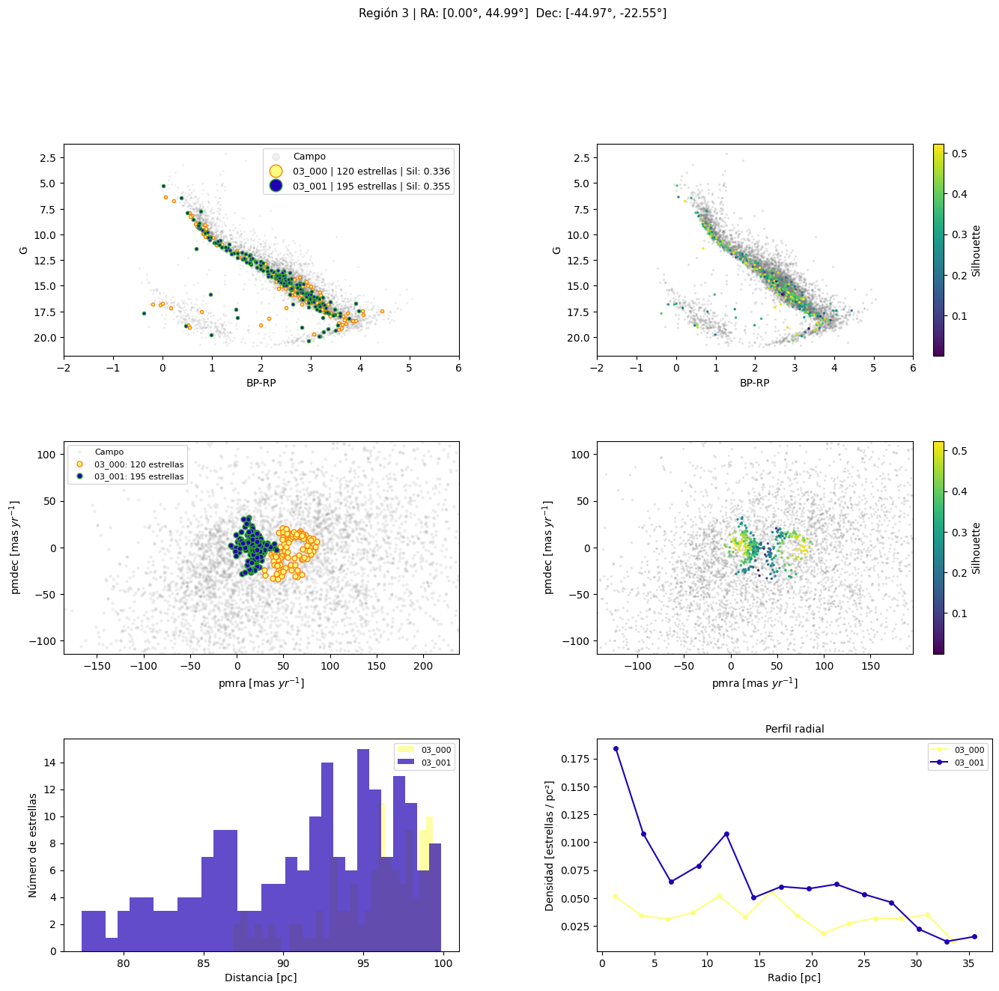

  5%|▍         | 3/64 [00:02<01:03,  1.05s/it]

Procesando región 4...
  RA:  [0.0051°, 45.0007°]  |  Dec: [-22.5475°, -0.1121°]


  6%|▋         | 4/64 [00:03<00:52,  1.14it/s]

  [SKIP] Región 4: ningún cluster encontrado.
Procesando región 5...
  RA:  [0.0093°, 44.9986°]  |  Dec: [-0.0962°, 22.3249°]


  8%|▊         | 5/64 [00:03<00:45,  1.30it/s]

  [SKIP] Región 5: ningún cluster encontrado.
Procesando región 6...
  RA:  [0.0135°, 44.9911°]  |  Dec: [22.3304°, 44.7616°]


  9%|▉         | 6/64 [00:04<00:38,  1.49it/s]

  [SKIP] Región 6: ningún cluster encontrado.
Procesando región 7...
  RA:  [0.0330°, 45.0020°]  |  Dec: [44.7647°, 67.1844°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


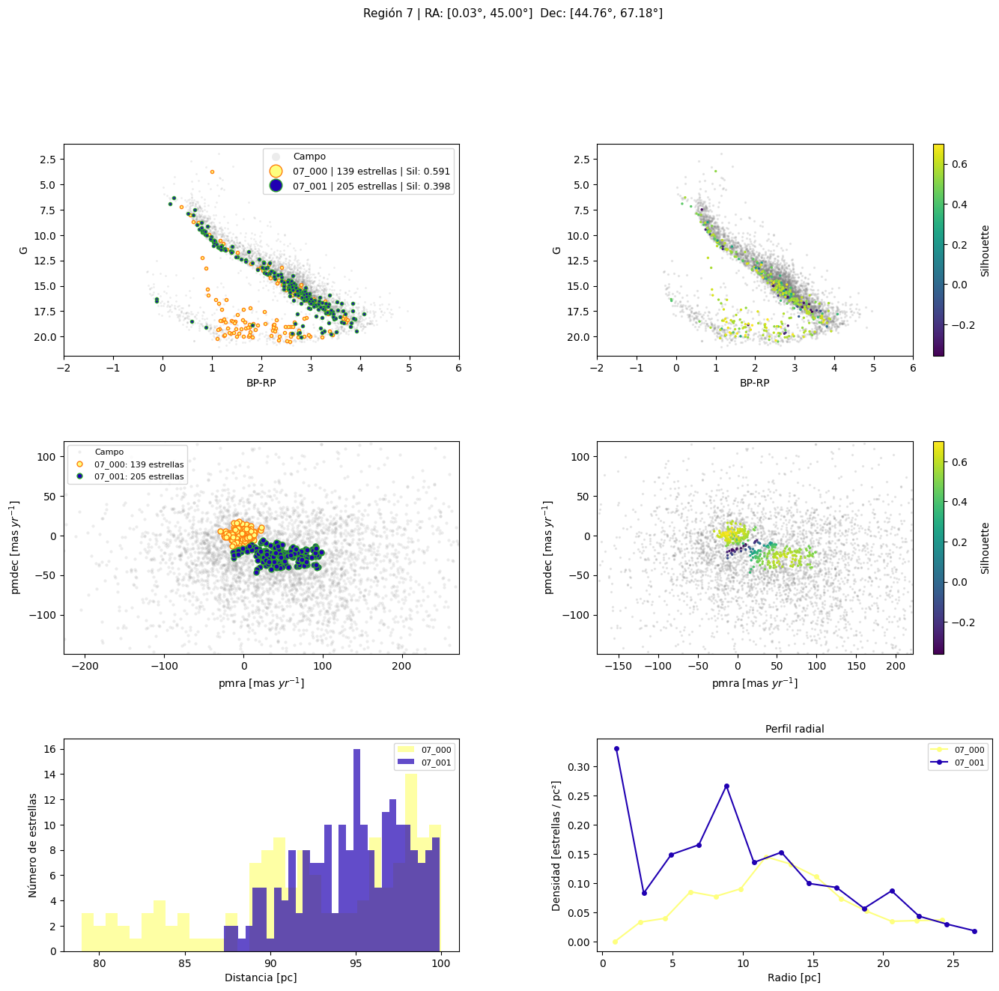

 11%|█         | 7/64 [00:06<01:00,  1.06s/it]

Procesando región 8...
  RA:  [0.0056°, 44.9788°]  |  Dec: [67.2061°, 89.6376°]
  [SKIP] Región 8: ningún cluster encontrado.
Procesando región 9...
  RA:  [45.0091°, 89.9128°]  |  Dec: [-89.3770°, -67.4425°]
  [SKIP] Región 9: ningún cluster encontrado.
Procesando región 10...
  RA:  [45.0035°, 89.9939°]  |  Dec: [-67.4202°, -44.9872°]


 16%|█▌        | 10/64 [00:06<00:27,  1.98it/s]

  [SKIP] Región 10: ningún cluster encontrado.
Procesando región 11...
  RA:  [45.0076°, 89.9953°]  |  Dec: [-44.9858°, -22.5538°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


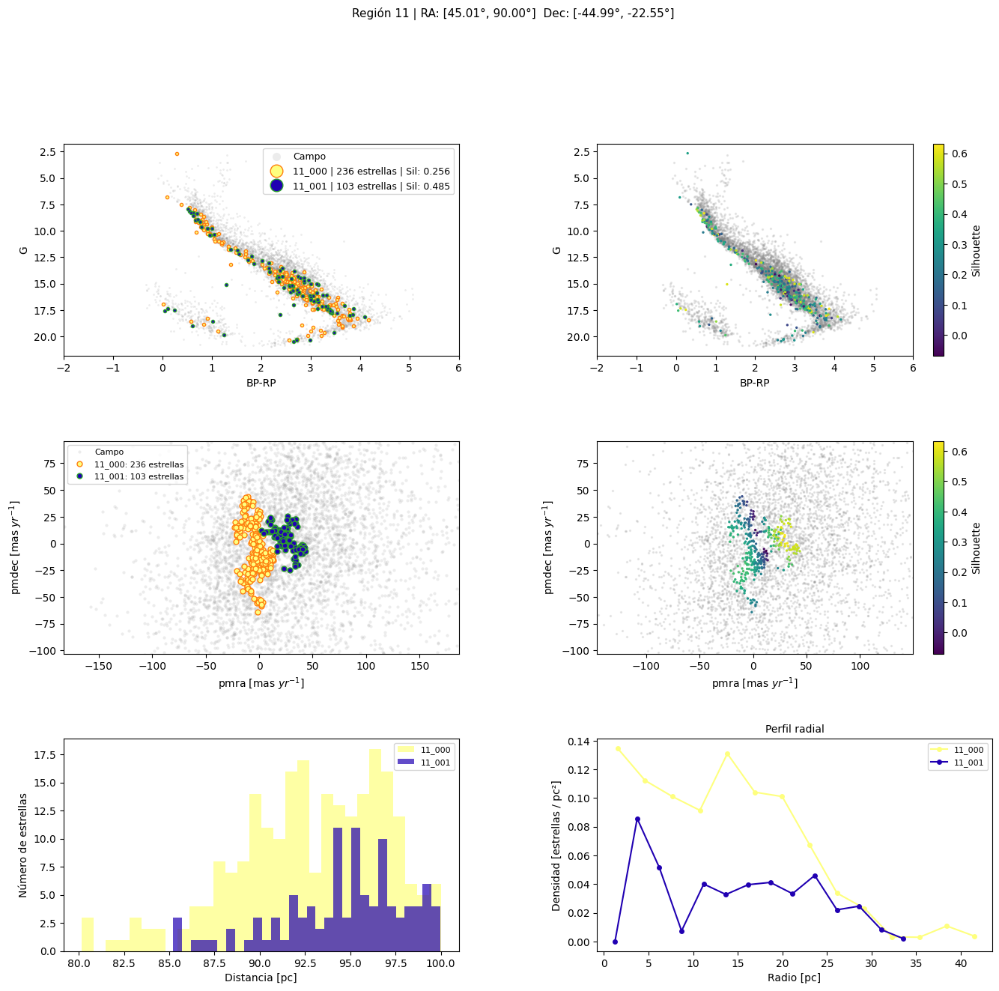

 17%|█▋        | 11/64 [00:08<00:43,  1.22it/s]

Procesando región 12...
  RA:  [45.0129°, 89.9940°]  |  Dec: [-22.5481°, -0.1166°]


 19%|█▉        | 12/64 [00:08<00:39,  1.30it/s]

  [SKIP] Región 12: ningún cluster encontrado.
Procesando región 13...
  RA:  [45.0027°, 89.9974°]  |  Dec: [-0.0808°, 22.3189°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


  [INFO] Región 13: 1 cluster(s) válido(s) — graficando sin silueta.


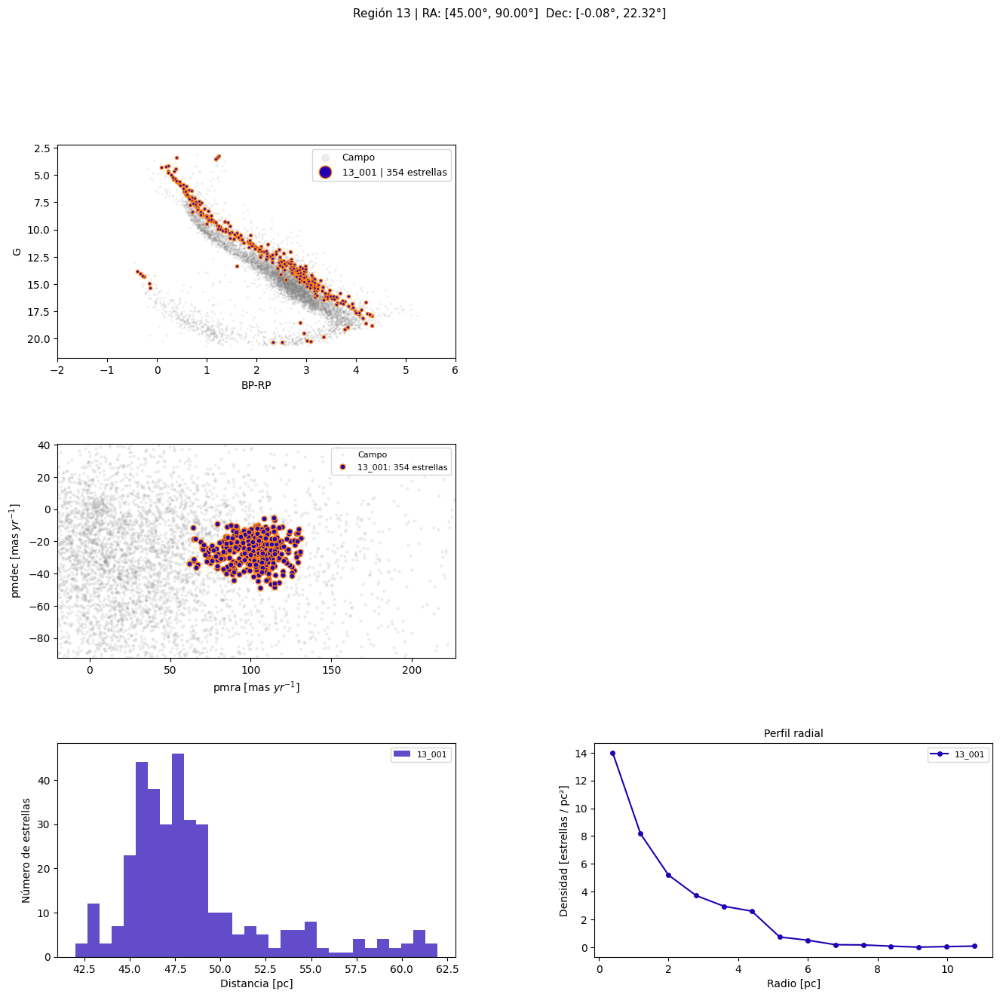

 20%|██        | 13/64 [00:10<00:51,  1.01s/it]

Procesando región 14...
  RA:  [45.0117°, 89.9911°]  |  Dec: [22.3377°, 44.7547°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


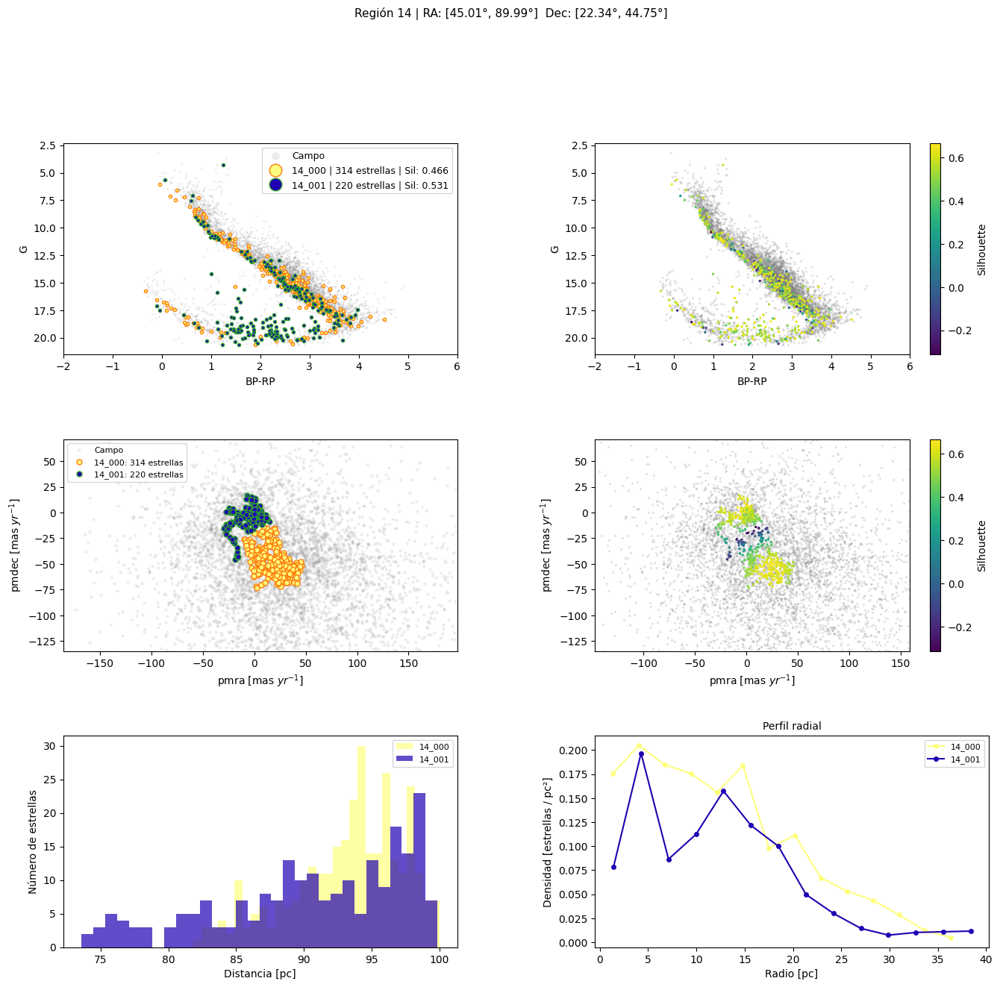

 22%|██▏       | 14/64 [00:12<01:04,  1.29s/it]

Procesando región 15...
  RA:  [45.0125°, 90.0009°]  |  Dec: [44.7842°, 67.1945°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


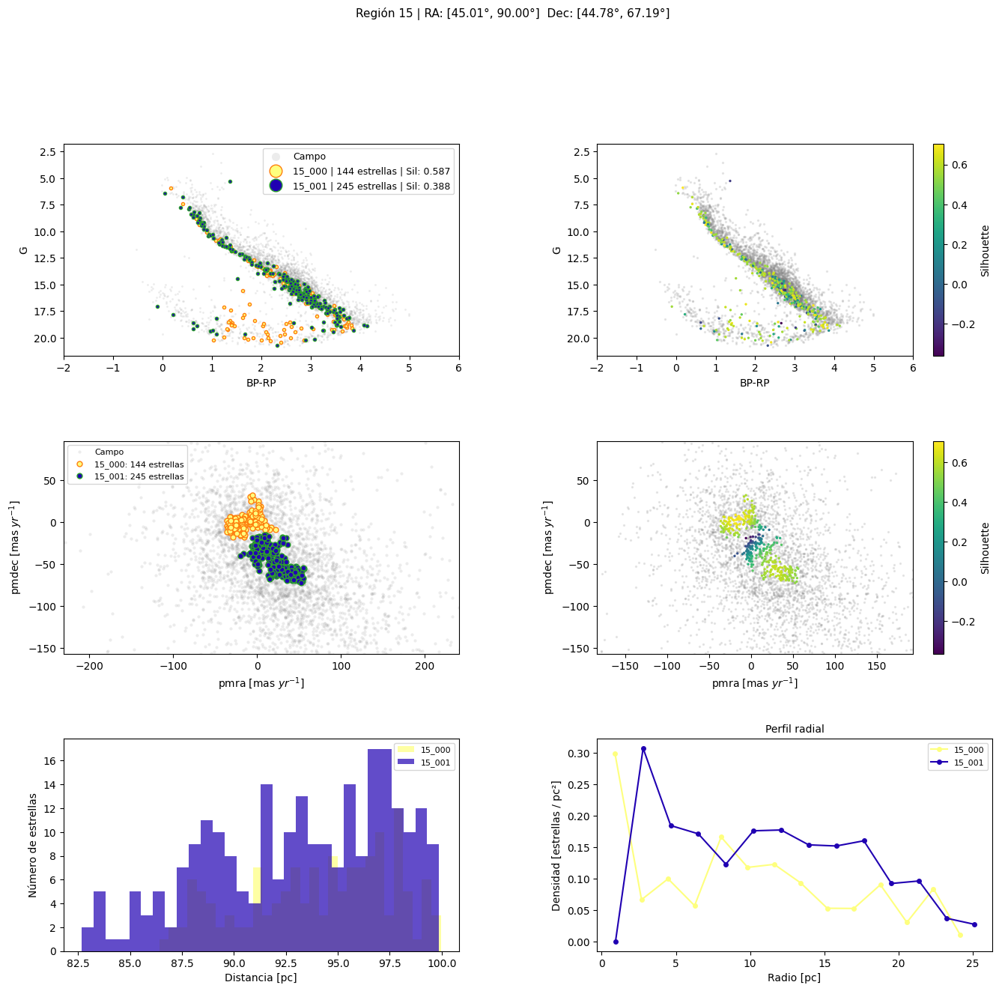

 27%|██▋       | 17/64 [00:14<00:38,  1.21it/s]

Procesando región 16...
  RA:  [45.0117°, 89.9955°]  |  Dec: [67.2011°, 89.6053°]
  [SKIP] Región 16: ningún cluster encontrado.
Procesando región 17...
  RA:  [90.0253°, 134.9794°]  |  Dec: [-89.8609°, -67.4249°]
  [SKIP] Región 17: ningún cluster encontrado.
Procesando región 18...
  RA:  [90.0043°, 135.0011°]  |  Dec: [-67.4147°, -44.9869°]


 28%|██▊       | 18/64 [00:14<00:31,  1.47it/s]

  [SKIP] Región 18: ningún cluster encontrado.
Procesando región 19...
  RA:  [90.0047°, 134.9950°]  |  Dec: [-44.9838°, -22.5491°]


 30%|██▉       | 19/64 [00:15<00:29,  1.50it/s]

  [SKIP] Región 19: ningún cluster encontrado.
Procesando región 20...
  RA:  [90.0084°, 134.9962°]  |  Dec: [-22.5473°, -0.1120°]


 31%|███▏      | 20/64 [00:16<00:29,  1.48it/s]

  [SKIP] Región 20: ningún cluster encontrado.
Procesando región 21...
  RA:  [90.0025°, 134.9981°]  |  Dec: [-0.1042°, 22.3245°]


 33%|███▎      | 21/64 [00:16<00:27,  1.54it/s]

  [SKIP] Región 21: ningún cluster encontrado.
Procesando región 22...
  RA:  [90.0115°, 134.9925°]  |  Dec: [22.3265°, 44.7562°]


 34%|███▍      | 22/64 [00:17<00:26,  1.59it/s]

  [SKIP] Región 22: ningún cluster encontrado.
Procesando región 23...
  RA:  [90.0358°, 134.9987°]  |  Dec: [44.7674°, 67.1964°]


 39%|███▉      | 25/64 [00:17<00:12,  3.24it/s]

  [SKIP] Región 23: ningún cluster encontrado.
Procesando región 24...
  RA:  [90.0678°, 134.9988°]  |  Dec: [67.2010°, 89.4409°]
  [SKIP] Región 24: ningún cluster encontrado.
Procesando región 25...
  RA:  [135.0064°, 180.0009°]  |  Dec: [-89.4715°, -67.4357°]
  [SKIP] Región 25: ningún cluster encontrado.
Procesando región 26...
  RA:  [135.0031°, 179.9932°]  |  Dec: [-67.4222°, -44.9884°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


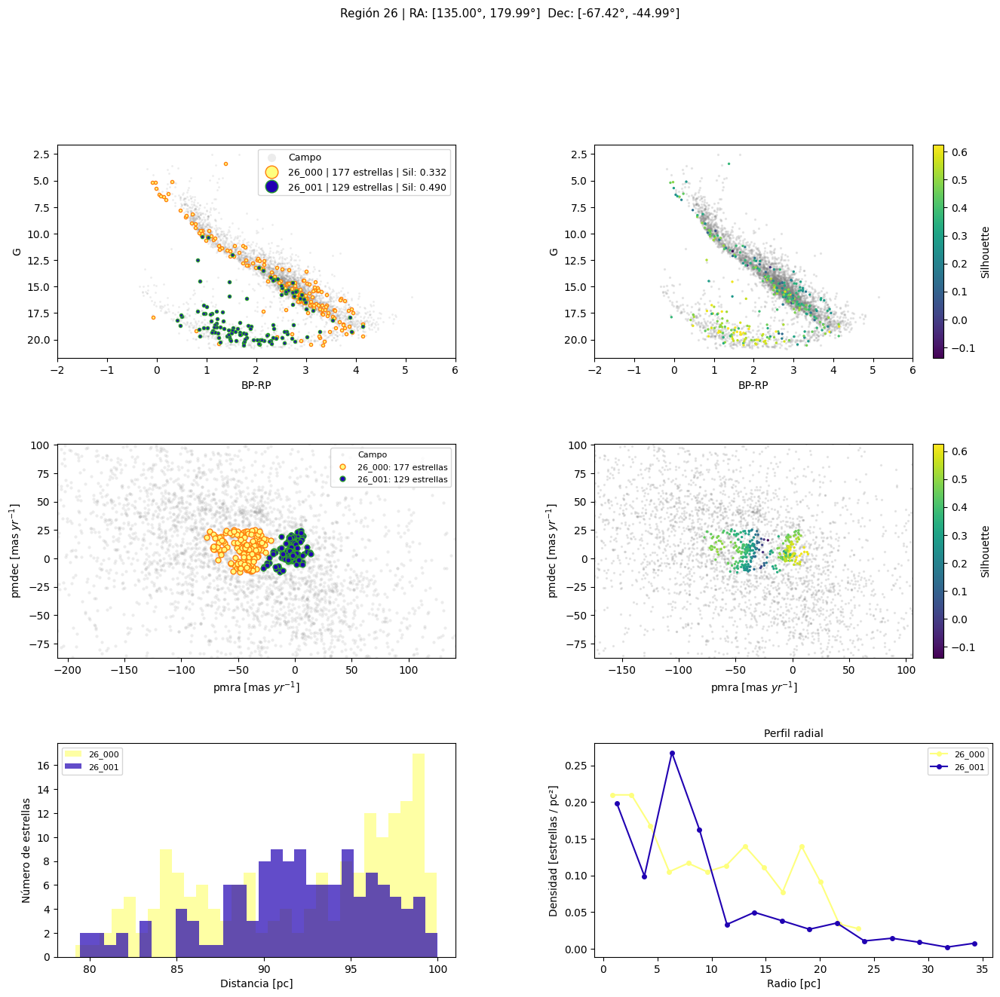

 41%|████      | 26/64 [00:19<00:26,  1.41it/s]

Procesando región 27...
  RA:  [135.0029°, 179.9980°]  |  Dec: [-44.9796°, -22.5497°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


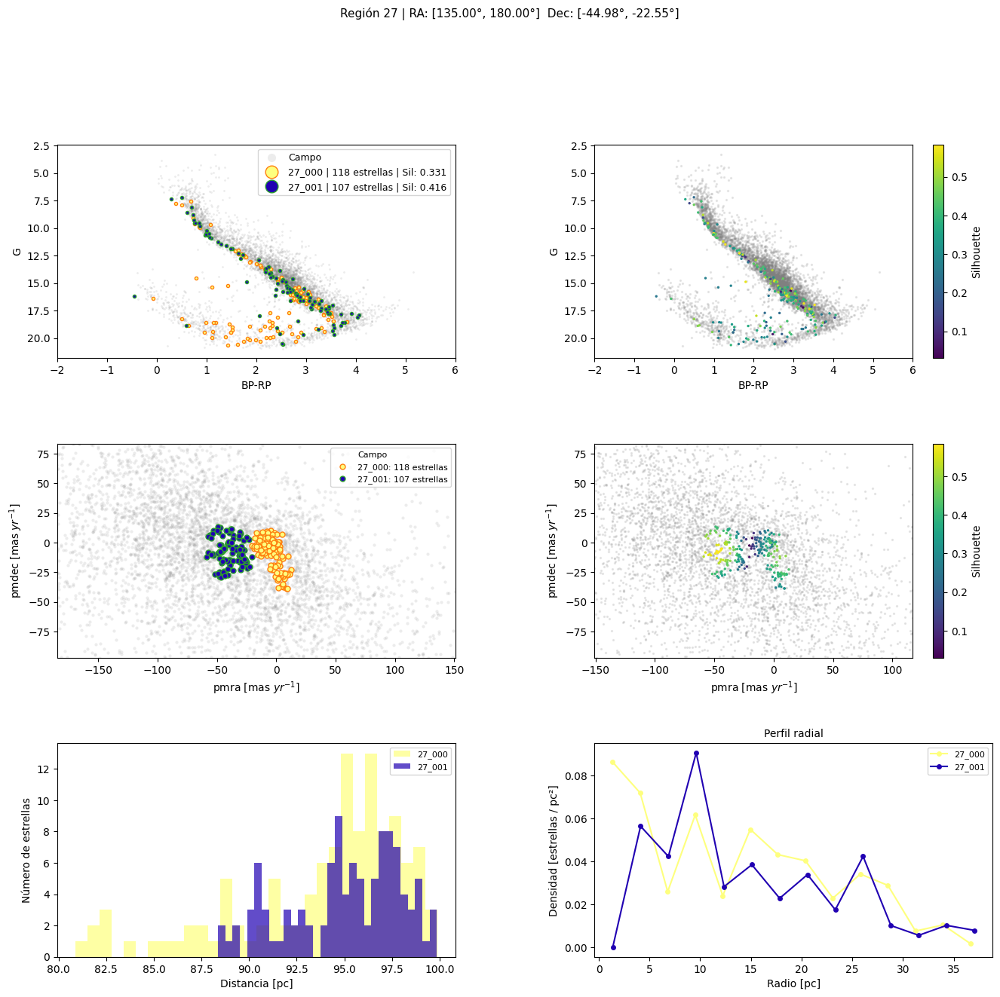

 42%|████▏     | 27/64 [00:21<00:40,  1.10s/it]

Procesando región 28...
  RA:  [135.0119°, 180.0006°]  |  Dec: [-22.5461°, -0.1121°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


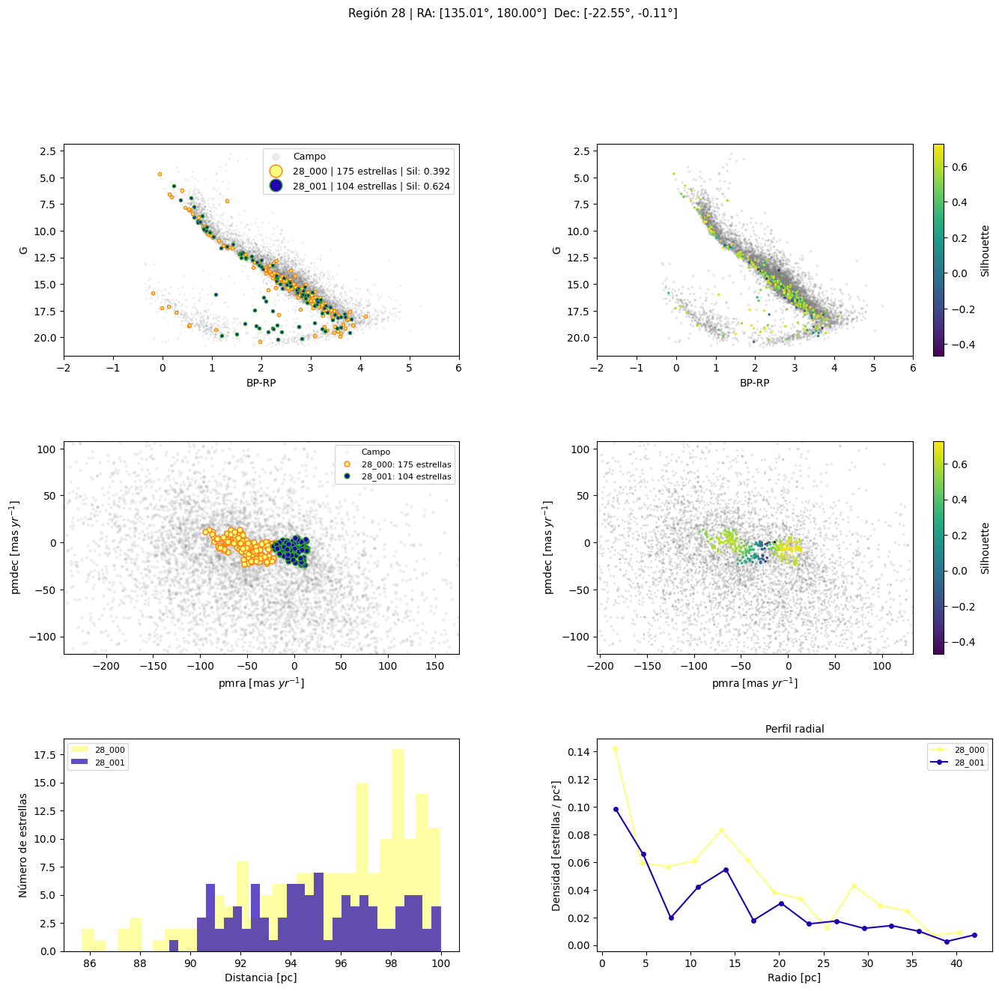

 44%|████▍     | 28/64 [00:24<00:52,  1.45s/it]

Procesando región 29...
  RA:  [135.0155°, 179.9955°]  |  Dec: [-0.1080°, 22.3180°]


 45%|████▌     | 29/64 [00:24<00:41,  1.20s/it]

  [SKIP] Región 29: ningún cluster encontrado.
Procesando región 30...
  RA:  [135.0090°, 179.9992°]  |  Dec: [22.3294°, 44.7584°]


 47%|████▋     | 30/64 [00:25<00:33,  1.03it/s]

  [SKIP] Región 30: ningún cluster encontrado.
Procesando región 31...
  RA:  [135.0071°, 179.9871°]  |  Dec: [44.7746°, 67.1906°]


 52%|█████▏    | 33/64 [00:25<00:13,  2.29it/s]

  [SKIP] Región 31: ningún cluster encontrado.
Procesando región 32...
  RA:  [135.0064°, 179.9550°]  |  Dec: [67.2131°, 89.1909°]
  [SKIP] Región 32: ningún cluster encontrado.
Procesando región 33...
  RA:  [180.0105°, 224.9929°]  |  Dec: [-89.4622°, -67.4267°]
  [SKIP] Región 33: ningún cluster encontrado.
Procesando región 34...
  RA:  [180.0128°, 224.9744°]  |  Dec: [-67.4161°, -44.9911°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


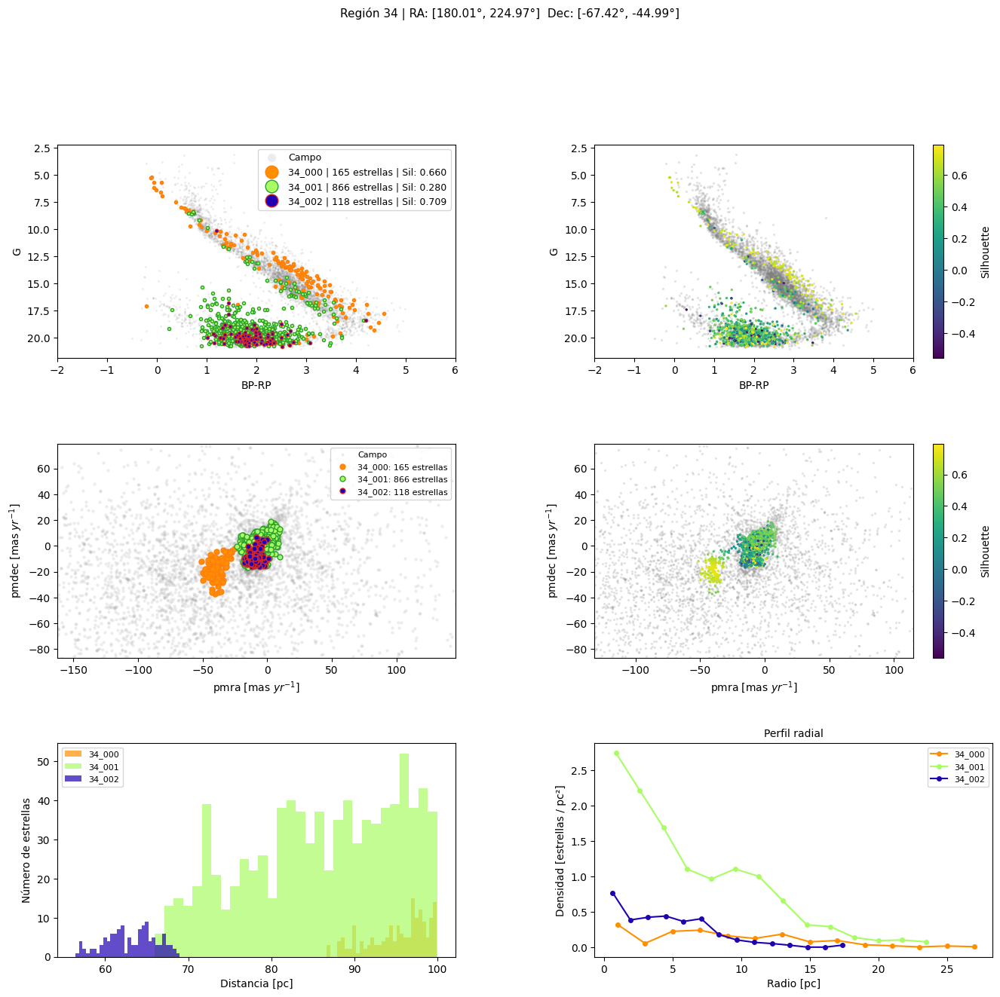

 53%|█████▎    | 34/64 [00:28<00:28,  1.07it/s]

Procesando región 35...
  RA:  [180.0022°, 224.9972°]  |  Dec: [-44.9832°, -22.5510°]


 55%|█████▍    | 35/64 [00:28<00:24,  1.21it/s]

  [SKIP] Región 35: ningún cluster encontrado.
Procesando región 36...
  RA:  [180.0063°, 224.9870°]  |  Dec: [-22.5455°, -0.1123°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


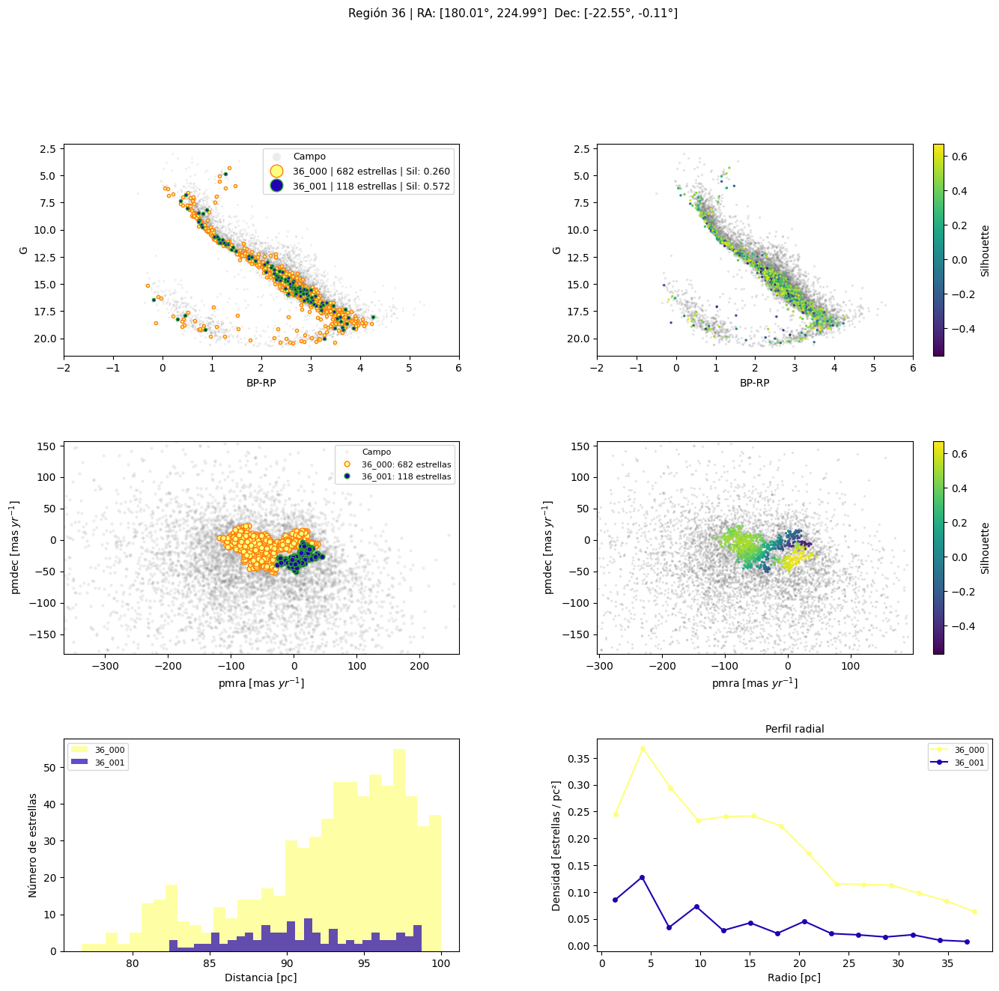

 56%|█████▋    | 36/64 [00:30<00:34,  1.24s/it]

Procesando región 37...
  RA:  [180.0042°, 224.9931°]  |  Dec: [-0.1093°, 22.3256°]


 58%|█████▊    | 37/64 [00:31<00:29,  1.08s/it]

  [SKIP] Región 37: ningún cluster encontrado.
Procesando región 38...
  RA:  [180.0123°, 224.9961°]  |  Dec: [22.3259°, 44.7450°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


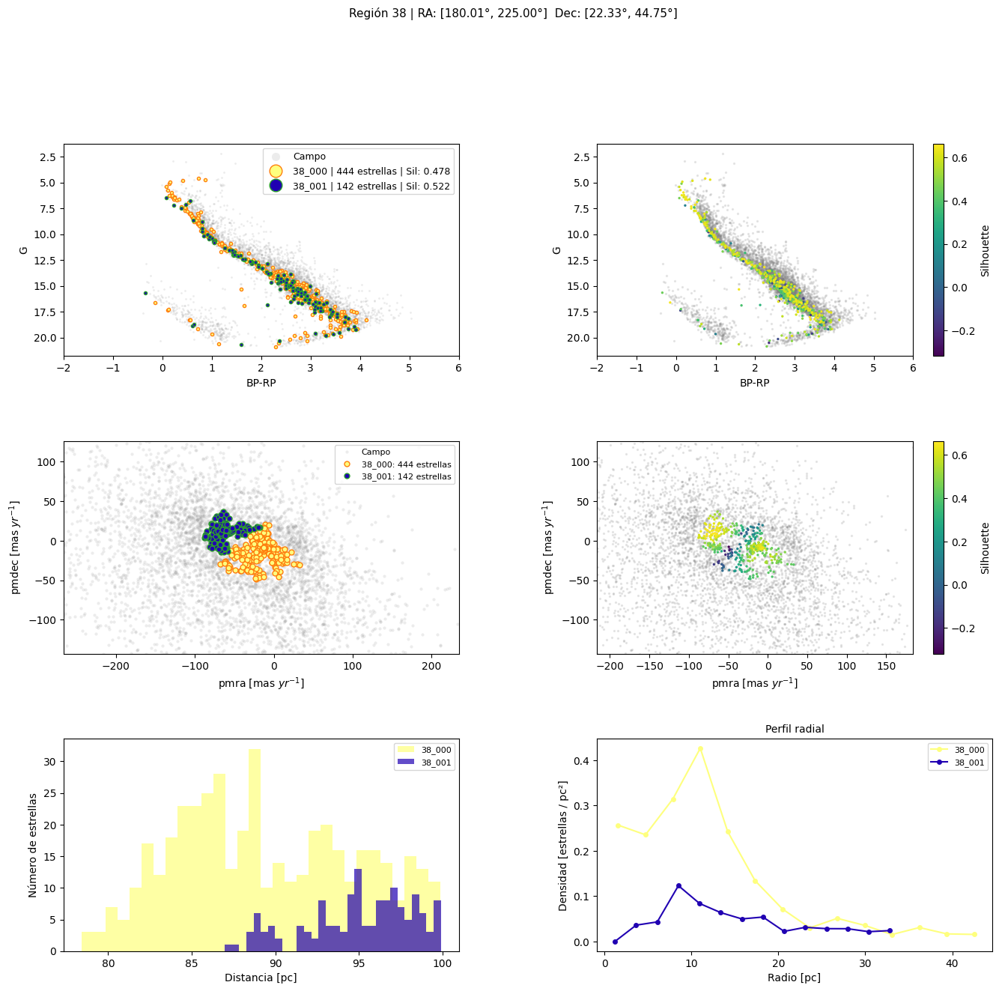

 59%|█████▉    | 38/64 [00:33<00:36,  1.42s/it]

Procesando región 39...
  RA:  [180.0070°, 224.9833°]  |  Dec: [44.7777°, 67.1958°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


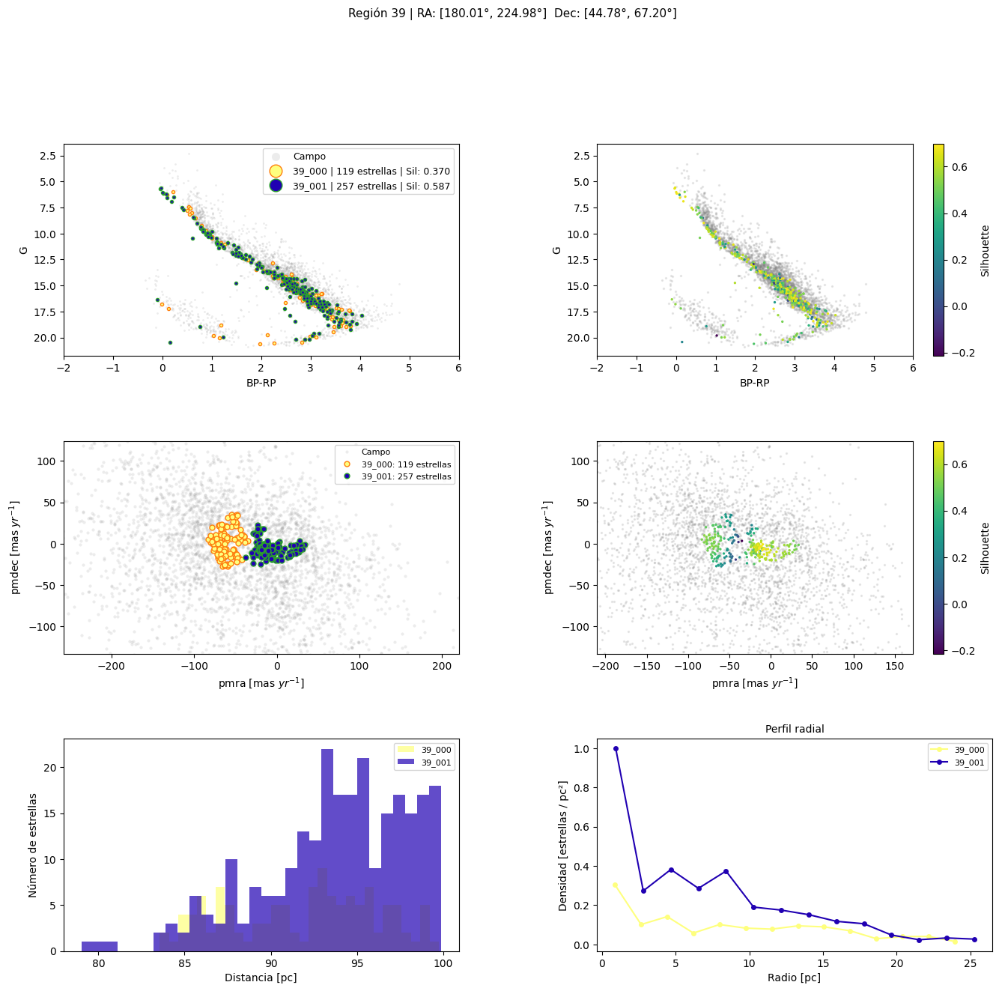

 64%|██████▍   | 41/64 [00:35<00:20,  1.13it/s]

Procesando región 40...
  RA:  [180.0114°, 224.9491°]  |  Dec: [67.2069°, 89.1445°]
  [SKIP] Región 40: ningún cluster encontrado.
Procesando región 41...
  RA:  [225.0143°, 269.9868°]  |  Dec: [-89.4614°, -67.4237°]
  [SKIP] Región 41: ningún cluster encontrado.
Procesando región 42...
  RA:  [225.0014°, 269.9978°]  |  Dec: [-67.4180°, -44.9863°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


  [INFO] Región 42: 1 cluster(s) válido(s) — graficando sin silueta.


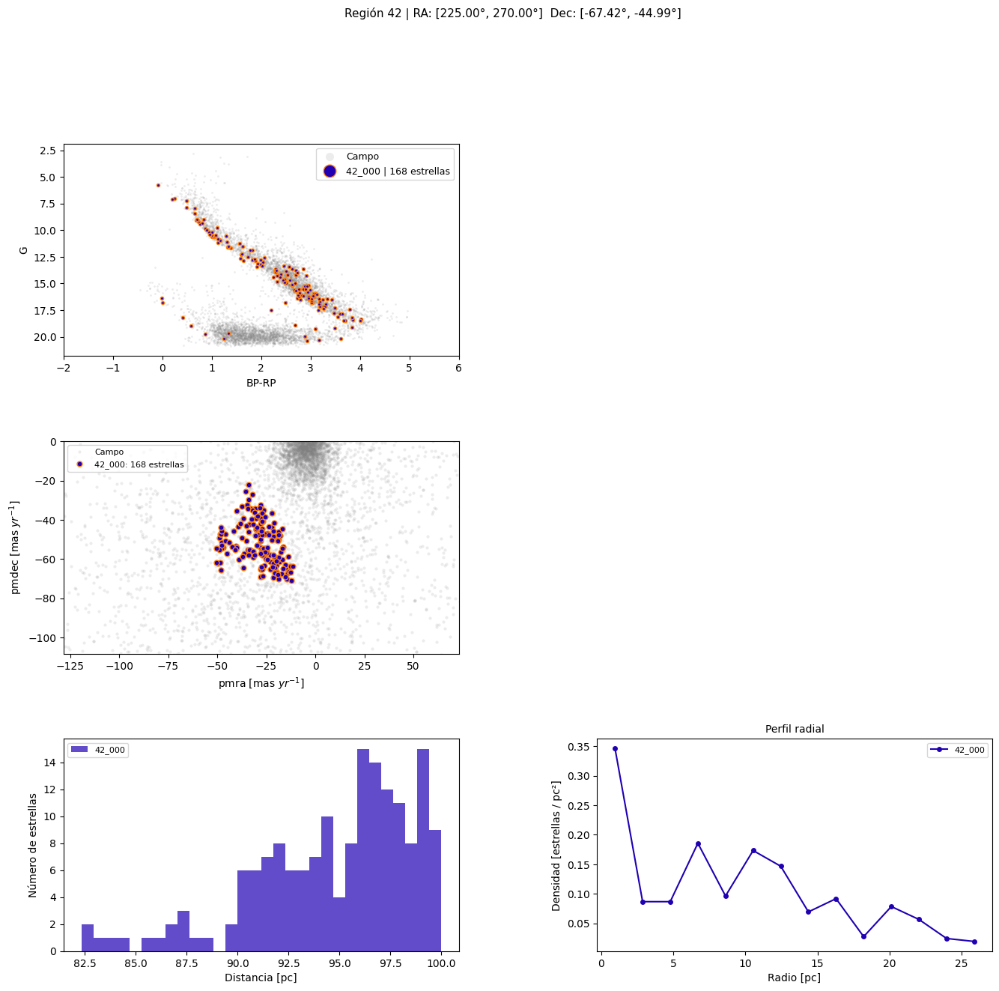

 66%|██████▌   | 42/64 [00:37<00:23,  1.06s/it]

Procesando región 43...
  RA:  [225.0017°, 270.0004°]  |  Dec: [-44.9782°, -22.5495°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


  [INFO] Región 43: 1 cluster(s) válido(s) — graficando sin silueta.


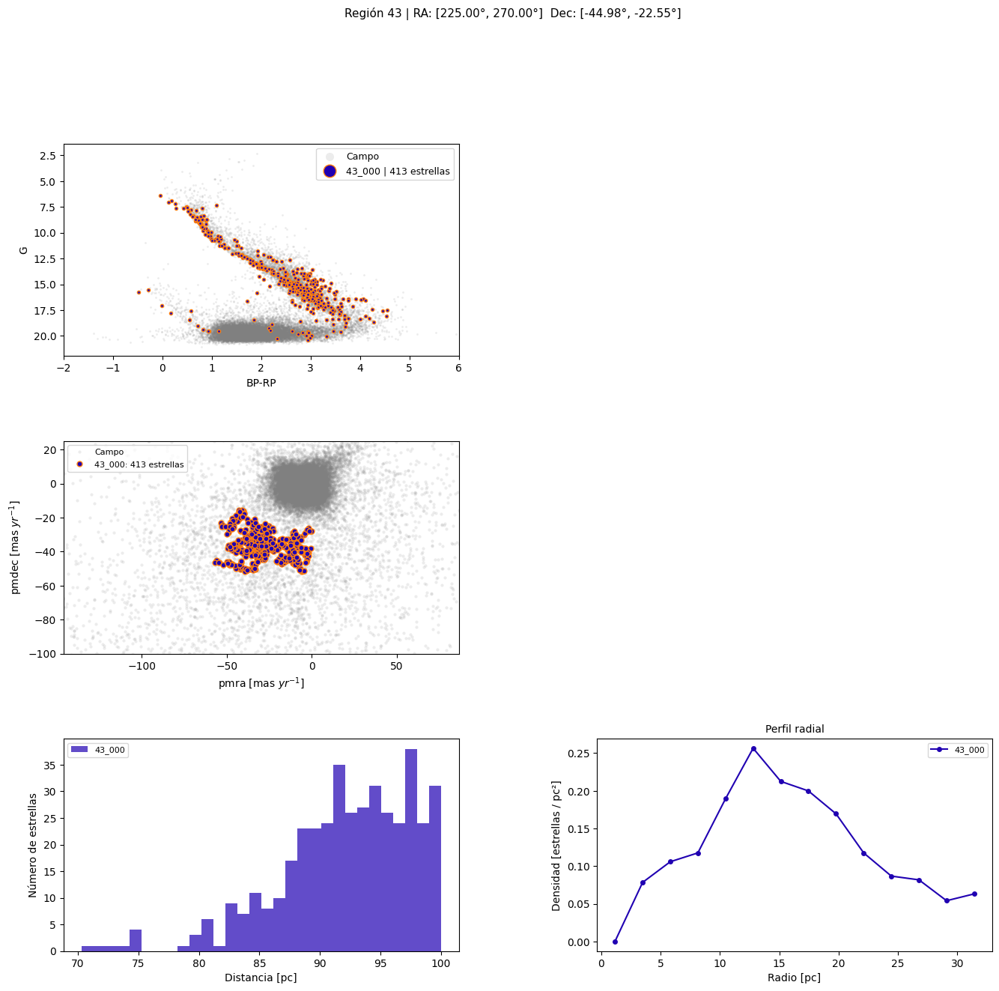

 67%|██████▋   | 43/64 [00:55<01:54,  5.44s/it]

Procesando región 44...
  RA:  [225.0070°, 269.9987°]  |  Dec: [-22.5486°, -0.1120°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


  [INFO] Región 44: 1 cluster(s) válido(s) — graficando sin silueta.


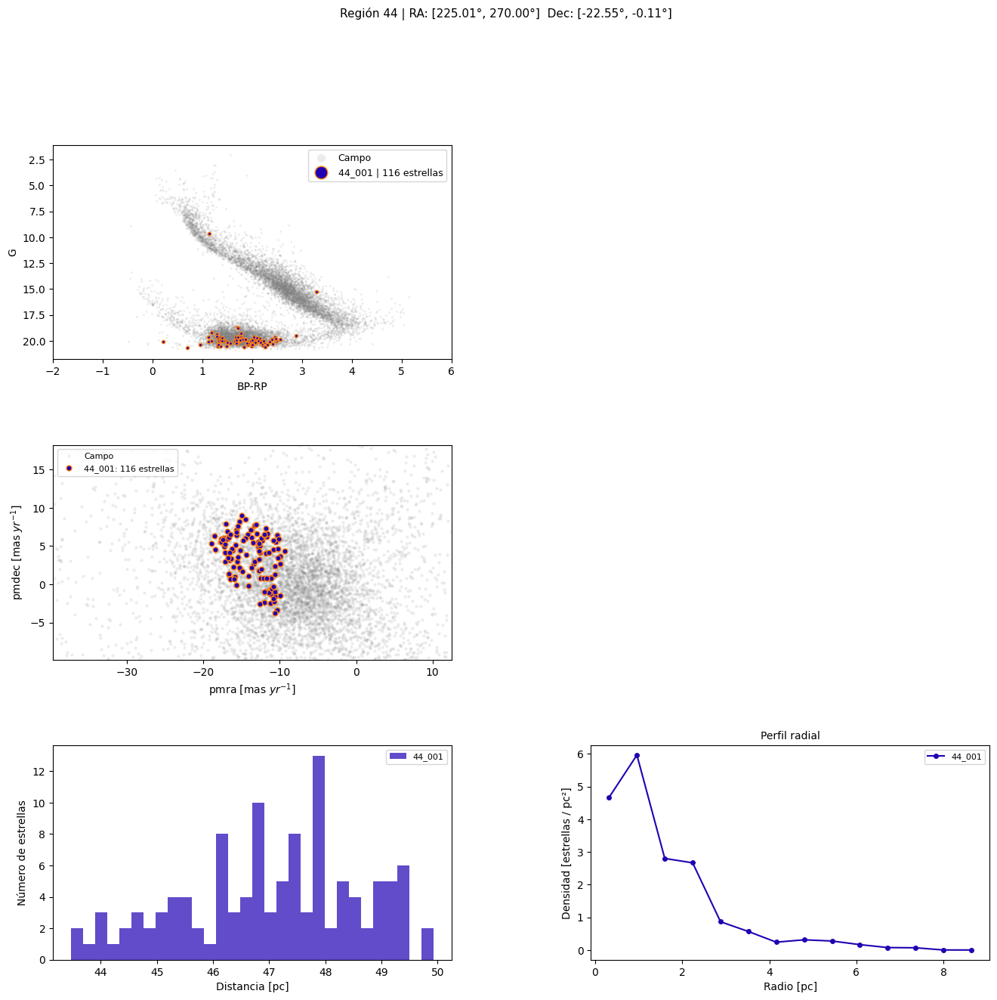

 69%|██████▉   | 44/64 [00:58<01:36,  4.81s/it]

Procesando región 45...
  RA:  [225.0039°, 269.9958°]  |  Dec: [-0.1093°, 22.3251°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


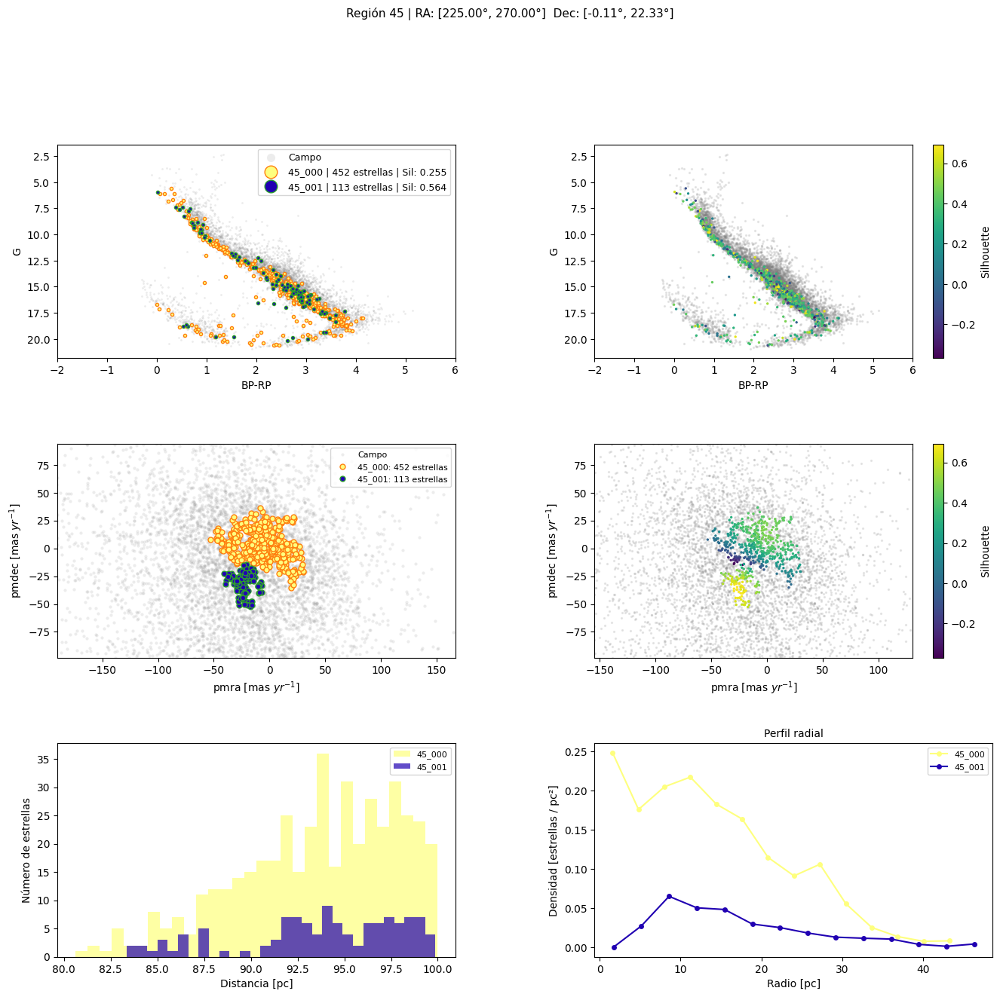

 70%|███████   | 45/64 [01:01<01:19,  4.17s/it]

Procesando región 46...
  RA:  [225.0089°, 269.9858°]  |  Dec: [22.3270°, 44.7570°]


 72%|███████▏  | 46/64 [01:01<00:56,  3.12s/it]

  [SKIP] Región 46: ningún cluster encontrado.
Procesando región 47...
  RA:  [225.0132°, 269.9907°]  |  Dec: [44.7674°, 67.1903°]


 77%|███████▋  | 49/64 [01:02<00:19,  1.32s/it]

  [SKIP] Región 47: ningún cluster encontrado.
Procesando región 48...
  RA:  [225.0063°, 269.9282°]  |  Dec: [67.2039°, 89.5811°]
  [SKIP] Región 48: ningún cluster encontrado.
Procesando región 49...
  RA:  [270.0145°, 314.9867°]  |  Dec: [-89.6915°, -67.4244°]
  [SKIP] Región 49: ningún cluster encontrado.
Procesando región 50...
  RA:  [270.0091°, 314.9650°]  |  Dec: [-67.4201°, -44.9951°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


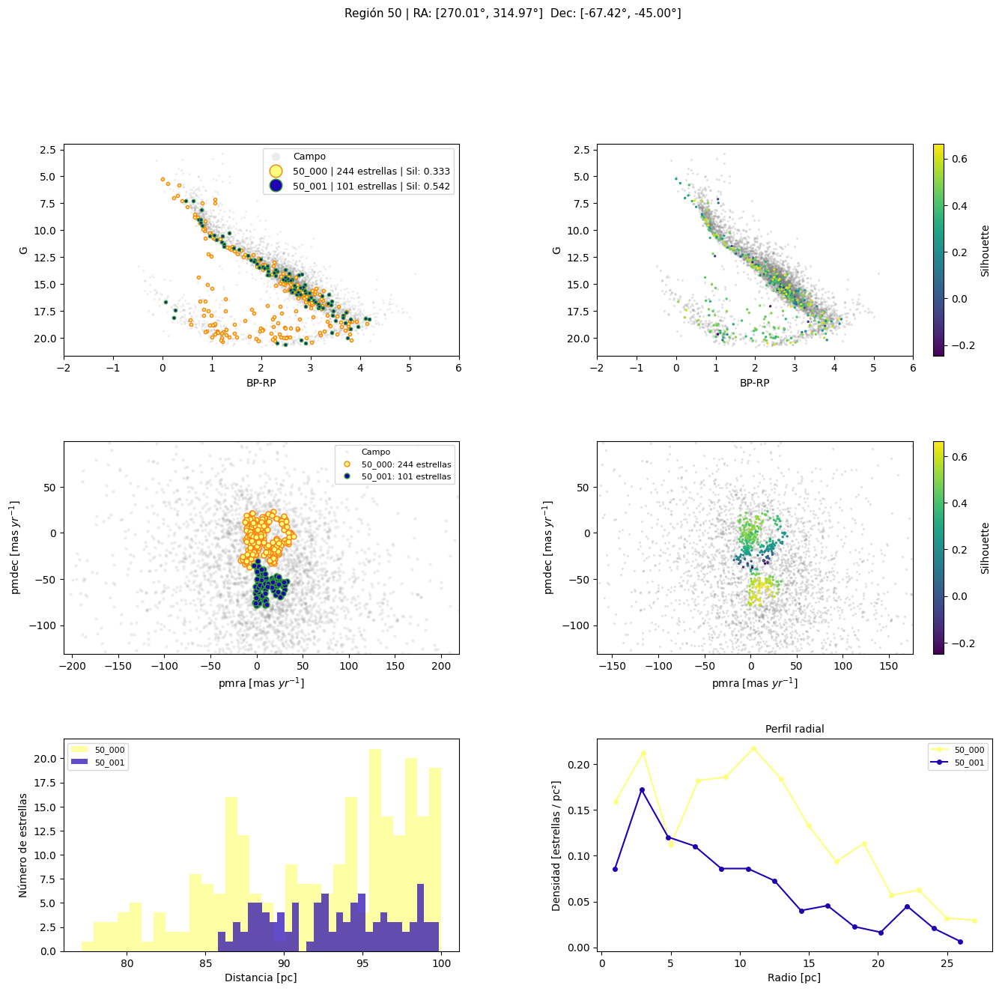

 78%|███████▊  | 50/64 [01:04<00:20,  1.45s/it]

Procesando región 51...
  RA:  [270.0006°, 314.9993°]  |  Dec: [-44.9847°, -22.5499°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


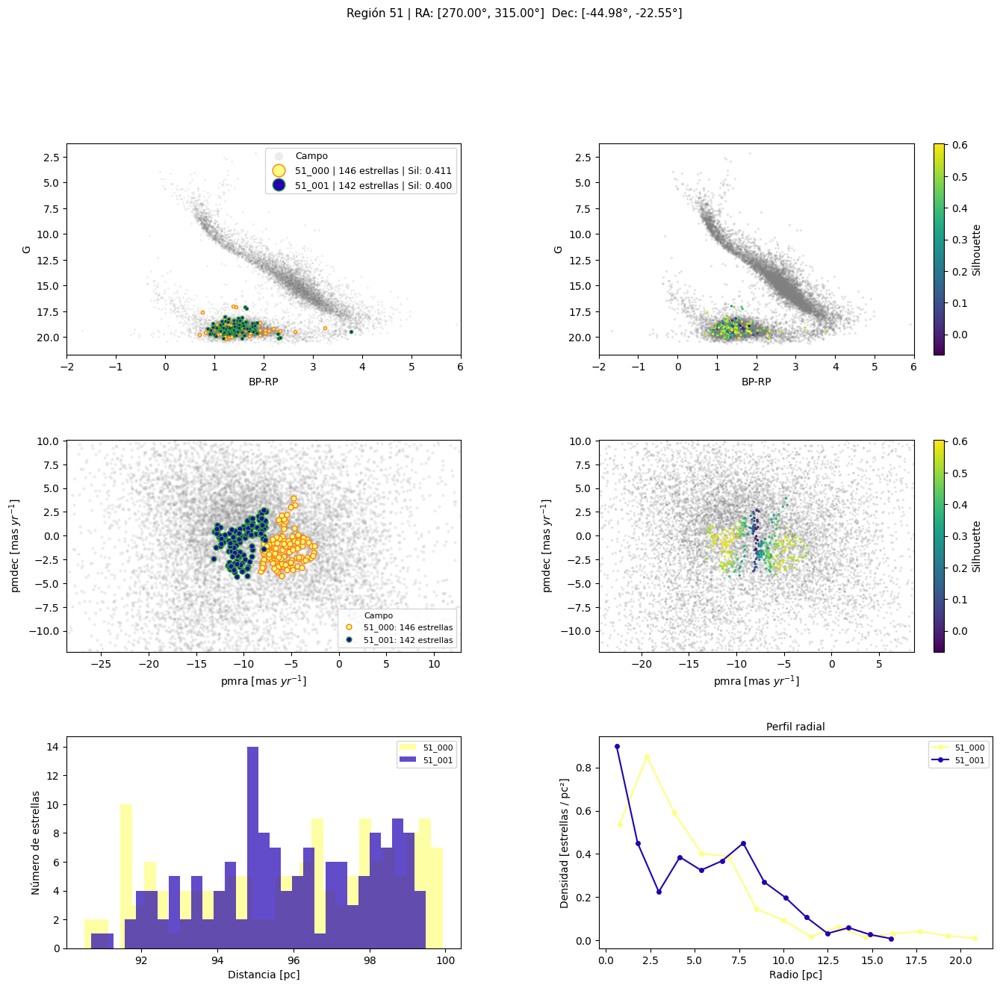

 80%|███████▉  | 51/64 [01:09<00:31,  2.39s/it]

Procesando región 52...
  RA:  [270.0029°, 314.9933°]  |  Dec: [-22.5486°, -0.1131°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


  [INFO] Región 52: 1 cluster(s) válido(s) — graficando sin silueta.


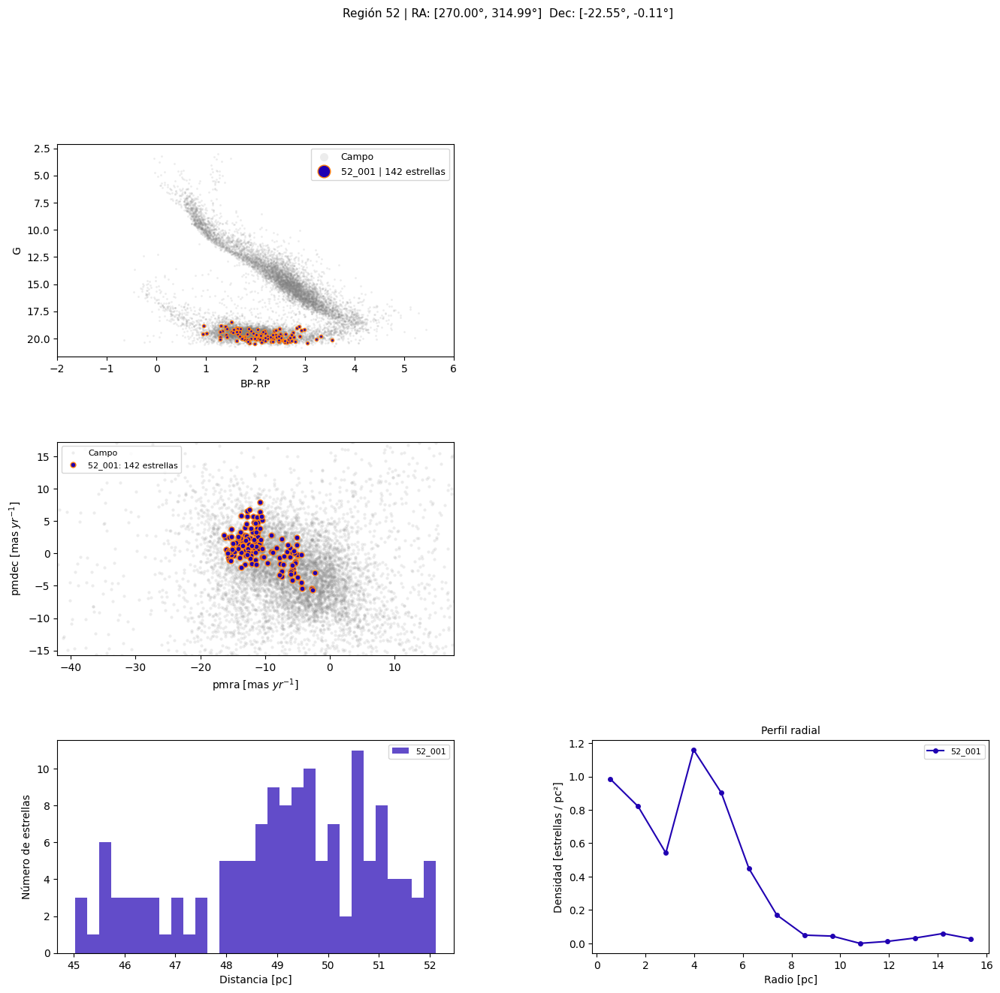

 81%|████████▏ | 52/64 [01:12<00:31,  2.66s/it]

Procesando región 53...
  RA:  [270.0027°, 314.9867°]  |  Dec: [-0.1104°, 22.3250°]


 83%|████████▎ | 53/64 [01:14<00:27,  2.46s/it]

  [SKIP] Región 53: ningún cluster encontrado.
Procesando región 54...
  RA:  [270.0054°, 314.9992°]  |  Dec: [22.3257°, 44.7478°]


 84%|████████▍ | 54/64 [01:15<00:20,  2.10s/it]

  [SKIP] Región 54: ningún cluster encontrado.
Procesando región 55...
  RA:  [270.0049°, 314.9692°]  |  Dec: [44.7704°, 67.1964°]


 89%|████████▉ | 57/64 [01:16<00:06,  1.09it/s]

  [SKIP] Región 55: ningún cluster encontrado.
Procesando región 56...
  RA:  [270.0159°, 314.9816°]  |  Dec: [67.2087°, 89.5773°]
  [SKIP] Región 56: ningún cluster encontrado.
Procesando región 57...
  RA:  [315.0299°, 359.9772°]  |  Dec: [-89.7477°, -67.4291°]
  [SKIP] Región 57: ningún cluster encontrado.
Procesando región 58...
  RA:  [315.0065°, 359.9948°]  |  Dec: [-67.4082°, -44.9883°]


 91%|█████████ | 58/64 [01:16<00:04,  1.33it/s]

  [SKIP] Región 58: ningún cluster encontrado.
Procesando región 59...
  RA:  [315.0104°, 359.9999°]  |  Dec: [-44.9840°, -22.5600°]


 92%|█████████▏| 59/64 [01:16<00:03,  1.49it/s]

  [SKIP] Región 59: ningún cluster encontrado.
Procesando región 60...
  RA:  [315.0023°, 359.9921°]  |  Dec: [-22.5463°, -0.1142°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


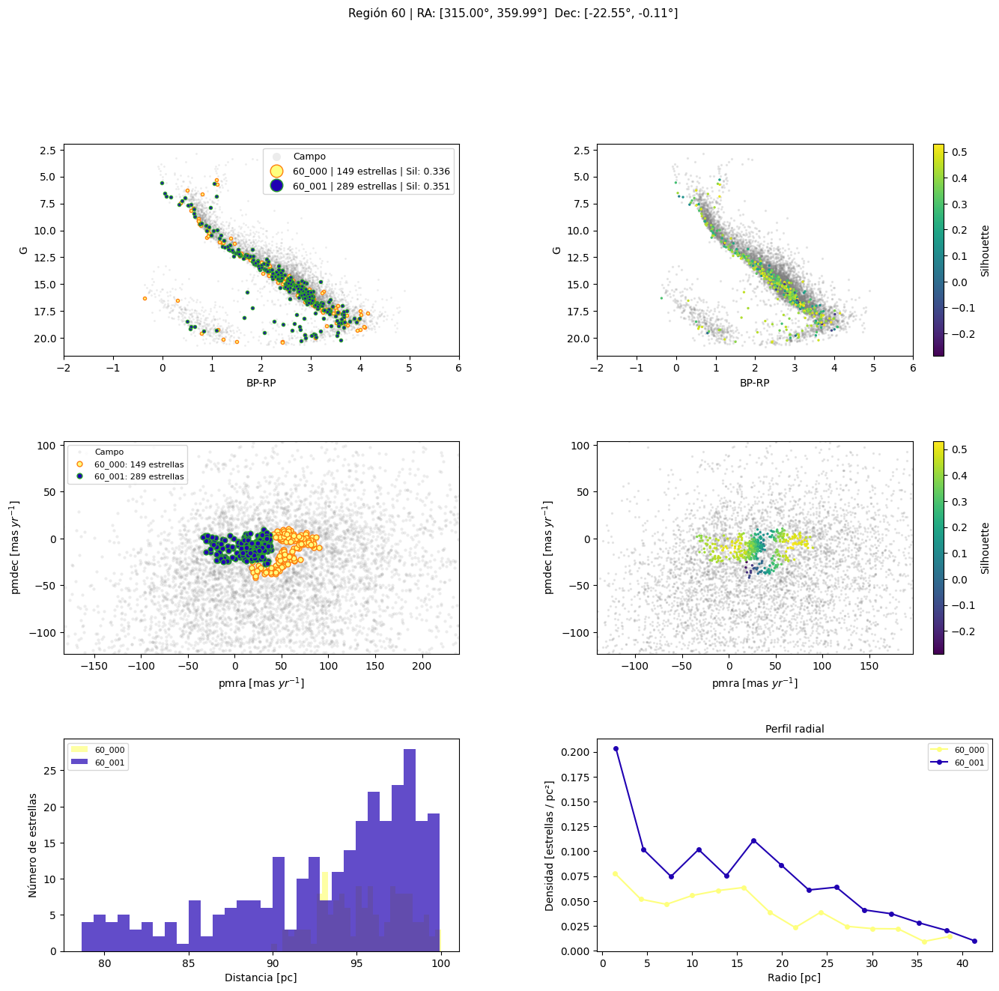

 94%|█████████▍| 60/64 [01:19<00:04,  1.15s/it]

Procesando región 61...
  RA:  [315.0009°, 359.9940°]  |  Dec: [-0.0919°, 22.3248°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


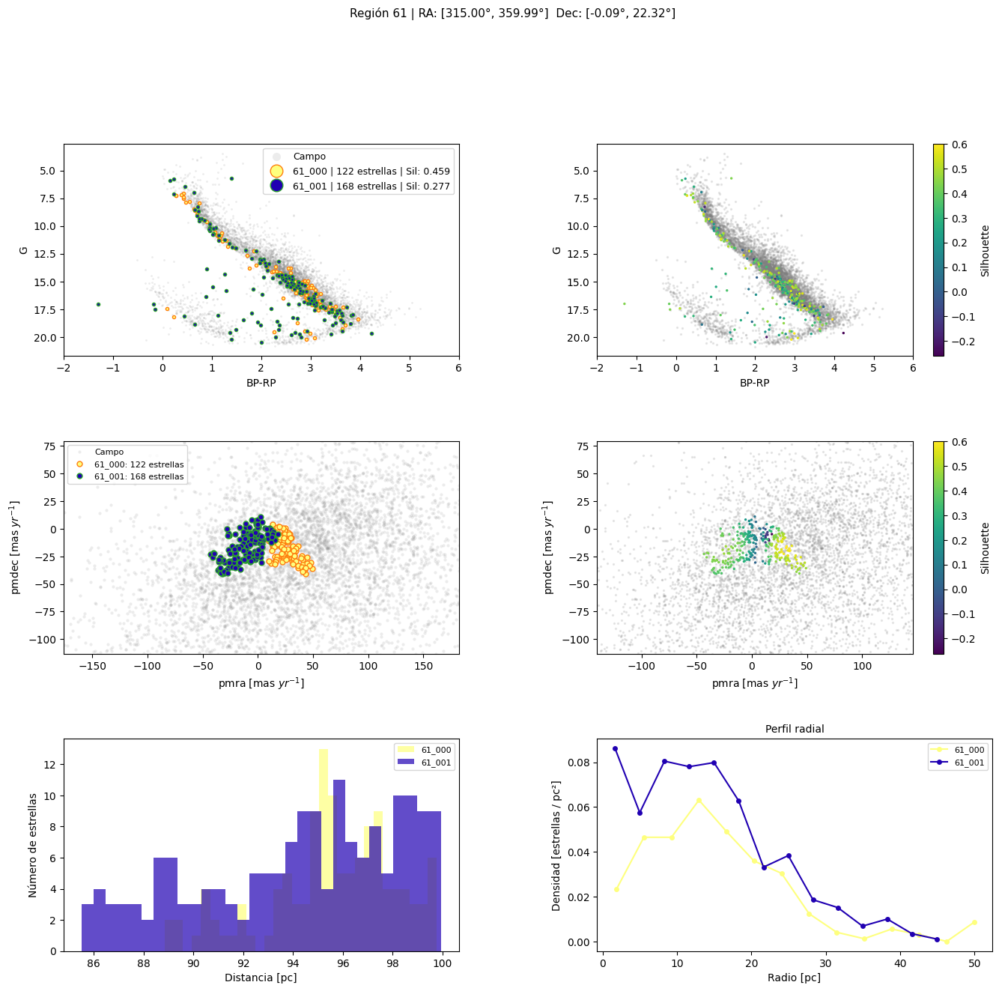

 95%|█████████▌| 61/64 [01:21<00:04,  1.42s/it]

Procesando región 62...
  RA:  [315.0026°, 359.9895°]  |  Dec: [22.3309°, 44.7554°]


 97%|█████████▋| 62/64 [01:22<00:02,  1.17s/it]

  [SKIP] Región 62: ningún cluster encontrado.
Procesando región 63...
  RA:  [315.0150°, 359.9817°]  |  Dec: [44.7641°, 67.1927°]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


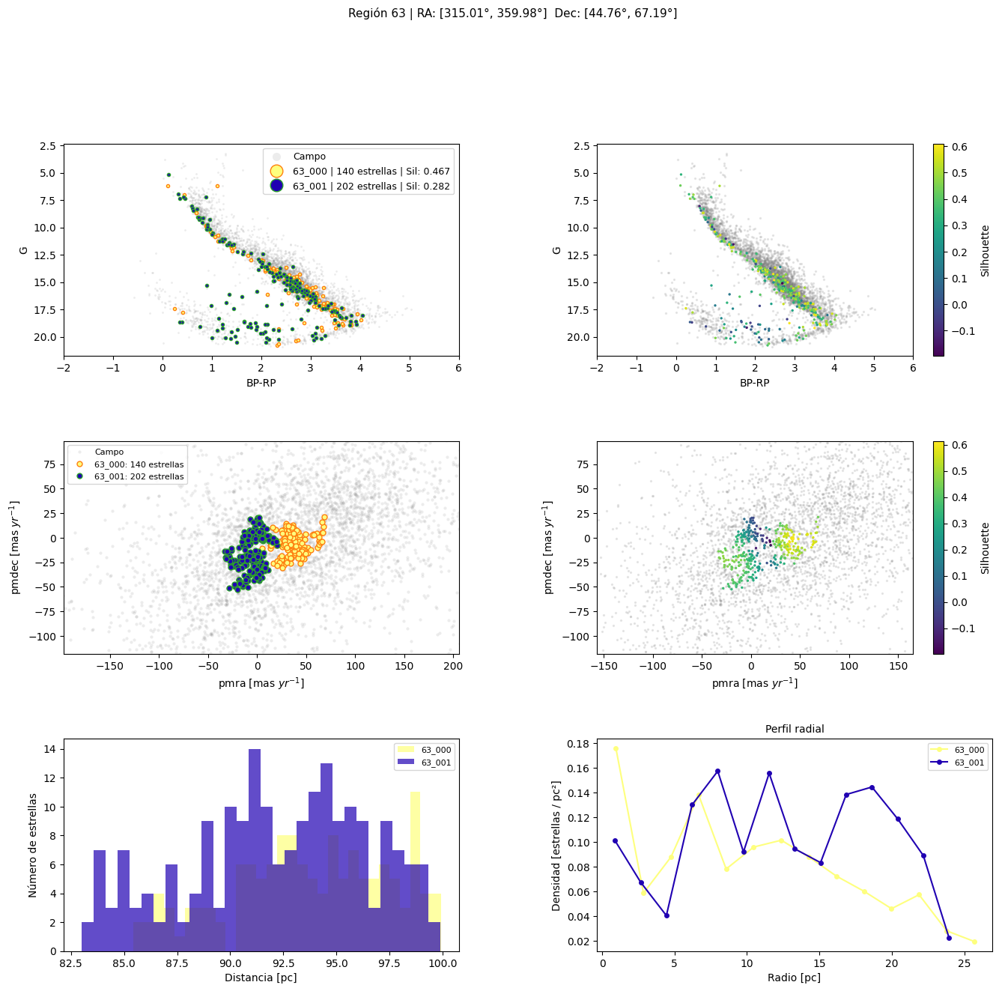

100%|██████████| 64/64 [01:24<00:00,  1.32s/it]

Procesando región 64...
  RA:  [315.0146°, 359.9463°]  |  Dec: [67.2100°, 89.5398°]
  [SKIP] Región 64: ningún cluster encontrado.


In [9]:
for cell_id in tqdm(sorted(df_full["cell_id"].unique())):
    print(f"Procesando región {cell_id}...")
    try:
        df = df_full[df_full["cell_id"] == cell_id].copy()

        ra_min, ra_max   = df['ra'].min(),  df['ra'].max()
        dec_min, dec_max = df['dec'].min(), df['dec'].max()
        print(f"  RA:  [{ra_min:.4f}°, {ra_max:.4f}°]  |  Dec: [{dec_min:.4f}°, {dec_max:.4f}°]")

        # Datos de la región, escalados
        data = RobustScaler().fit_transform(df[clustering_on])

        # Modelo HDBSCAN
        hd = HDBSCAN(min_cluster_size=SIZE, min_samples=SAMPLES, metric='euclidean').fit(data)

        # Reclasificar clusters con más de 1000 elementos como ruido
        labels = hd.labels_.copy()
        for lbl in set(labels):
            if lbl != -1 and np.sum(labels == lbl) > 1000:
                labels[labels == lbl] = -1

        df['label_hb'] = labels
        unique_labels = set(labels)
        num_clusters = len(unique_labels) - (1 if -1 in unique_labels else 0)

        # ── Asignar cluster_id global ────────────────────────────────────────
        df['cluster_id'] = df['label_hb'].apply(lambda l: make_cluster_id(cell_id, l))
        # Mapeo local → global para las gráficas
        id_map = {lbl: make_cluster_id(cell_id, lbl) for lbl in unique_labels}

        # Escribir de vuelta a df_full
        if 'cluster_id' not in df_full.columns:
            df_full['cluster_id'] = None
        df_full.loc[df.index, 'cluster_id'] = df['cluster_id']

        if num_clusters < 2:
            if num_clusters == 0:
                print(f"  [SKIP] Región {cell_id}: ningún cluster encontrado.")
                continue
            print(f"  [INFO] Región {cell_id}: {num_clusters} cluster(s) válido(s) — graficando sin silueta.")
            showGraphics(df, unique_labels, id_map, with_silhouette=False, cell_id=cell_id)
            continue

        # Siluetas
        mask = labels != -1
        sil_values = np.full(len(labels), np.nan)
        sil_values[mask] = silhouette_samples(data[mask], labels[mask])

        sil_per_cluster = pd.Series(np.nan, index=df.index)
        for lbl in unique_labels:
            if lbl != -1:
                cond = df['label_hb'] == lbl
                sil_per_cluster[cond] = np.nanmean(sil_values[cond.values])

        df['cluster_silhouette'] = sil_per_cluster
        df['silhouette'] = sil_values

        # Mostrar gráficas
        showGraphics(df, unique_labels, id_map, with_silhouette=True, cell_id=cell_id)

    except ValueError as e:
        print(f"  [ERROR] Región {cell_id} — ValueError: {e}")
    except Exception as e:
        print(f"  [ERROR] Región {cell_id} — {type(e).__name__}: {e}")

In [ ]:
import pandas as pd
df_full = pd.read_csv("clustered_data_100pc.csv")

In [3]:
import matplotlib.pyplot as plt

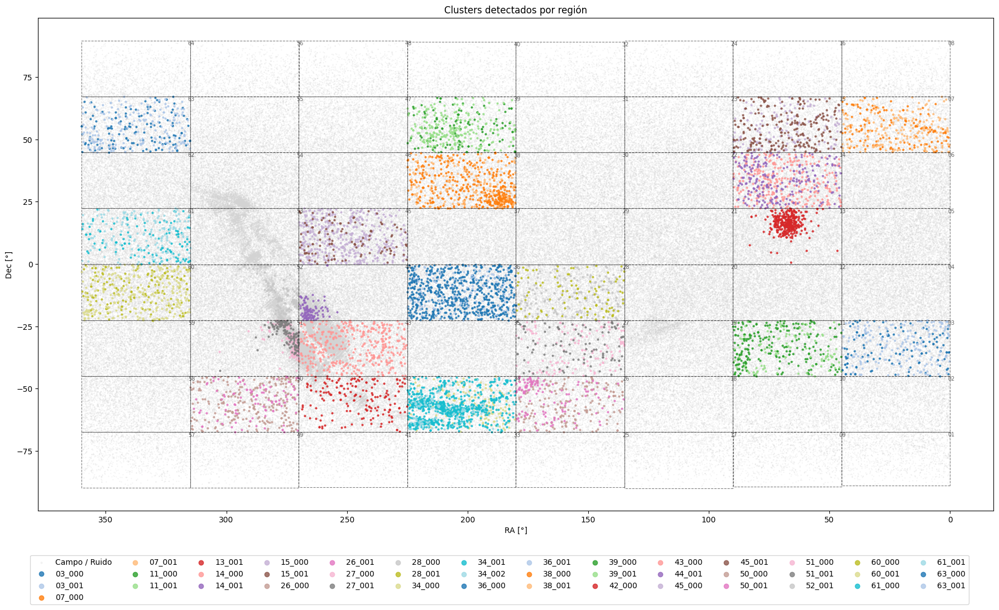

In [6]:
fig, ax = plt.subplots(figsize=(18, 10))

# ── Campo (no asignado o ruido) ──────────────────────────────────────────────
noise = df_full['cluster_id'].isna() | df_full['cluster_id'].str.endswith('_999')
ax.scatter(
    df_full.loc[noise, 'ra'],
    df_full.loc[noise, 'dec'],
    s=0.5, color='lightgray', alpha=0.2, label='Campo / Ruido', rasterized=True
)

# ── Clusters ─────────────────────────────────────────────────────────────────
cluster_ids = sorted(
    df_full.loc[~noise & df_full['cluster_id'].notna(), 'cluster_id'].unique()
)
cmap = plt.cm.tab20
cluster_colors = {cid: cmap(i % 20) for i, cid in enumerate(cluster_ids)}

for cid in cluster_ids:
    mask = df_full['cluster_id'] == cid
    ax.scatter(
        df_full.loc[mask, 'ra'],
        df_full.loc[mask, 'dec'],
        s=4, color=cluster_colors[cid], alpha=0.8, label=cid, rasterized=True
    )

# ── Demarcación de regiones ───────────────────────────────────────────────────
for cell_id in sorted(df_full['cell_id'].unique()):
    cell_df = df_full[df_full['cell_id'] == cell_id]
    ra_min,  ra_max  = cell_df['ra'].min(),  cell_df['ra'].max()
    dec_min, dec_max = cell_df['dec'].min(), cell_df['dec'].max()

    rect = plt.Rectangle(
        (ra_min, dec_min),
        ra_max - ra_min,
        dec_max - dec_min,
        linewidth=0.8, edgecolor='black', facecolor='none', linestyle='--', alpha=0.5
    )
    ax.add_patch(rect)
    ax.text(
        ra_min + (ra_max - ra_min) * 0.02,
        dec_max - (dec_max - dec_min) * 0.08,
        f"{int(cell_id):02d}",
        fontsize=7, color='black', alpha=0.6
    )

# ── Formato ───────────────────────────────────────────────────────────────────
ax.set_xlabel("RA [°]")
ax.set_ylabel("Dec [°]")
ax.set_title("Clusters detectados por región")
ax.invert_xaxis()

# Legend debajo, ancho completo
handles, labels = ax.get_legend_handles_labels()
ncols = max(1, len(handles) // 3)
plt.subplots_adjust(bottom=0.13)
legend = fig.legend(
    handles, labels,
    markerscale=3, fontsize=10,
    loc='upper center',
    bbox_to_anchor=(0.5, 0),   # debajo de la figura
    ncol=ncols,
    borderaxespad=0,
    frameon=True
)

plt.tight_layout()
plt.subplots_adjust(bottom=0.08)  # espacio para el legend
plt.show()

In [11]:
# ── Resumen global ────────────────────────────────────────────────────────────
all_clusters = df_full.loc[
    df_full['cluster_id'].notna() & ~df_full['cluster_id'].str.endswith('_999'),
    'cluster_id'
].unique()

regions_with_clusters = set(cid.split('_')[0] for cid in all_clusters)

total_clusters  = len(all_clusters)
total_regions   = len(regions_with_clusters)
avg_per_region  = total_clusters / total_regions if total_regions > 0 else 0

print(f"Total de clusters hallados:        {total_clusters}")
print(f"Regiones con al menos 1 cluster:   {total_regions}")
print(f"Promedio de clusters por región:   {avg_per_region:.2f}")

Total de clusters hallados:        42
Regiones con al menos 1 cluster:   23
Promedio de clusters por región:   1.83


In [12]:
df_39 = df_full[df_full["cluster_id"]=="39_001"]

In [13]:
df_39.to_csv("39_001_100pc.csv")

In [14]:
df_63 = df_full[df_full["cluster_id"]=="63_001"]
df_63.to_csv("63_001_100pc.csv")

In [15]:
df_38 = df_full[df_full["cluster_id"]=="38_000"]
df_38.to_csv("38_000_100pc.csv")

In [16]:
df_13 = df_full[df_full["cluster_id"]=="13_001"]
df_13.to_csv("13_001_100pc.csv")

In [17]:
df_full.to_csv("clustered_data_100pc.csv")